In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
from scipy.stats import chi2_contingency

In [2]:
df = pd.read_csv('benign_malignant_tumor.csv')

In [3]:
# Checking structure of dataframe
df

,id,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,symmetry_se,dimension_se,texture_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,B,12.32,12.39,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,...,0.01924,0.002248,15.64,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,...,0.03504,0.003318,22.94,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,...,0.01718,0.002198,26.44,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,...,0.01580,0.003442,15.77,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,...,0.01647,0.001767,15.73,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,911320502,B,13.17,18.22,0.07466,0.05994,0.04859,0.02870,0.1454,0.05549,...,0.01093,0.001672,23.89,687.6,0.1282,0.1965,0.18760,0.10450,0.2235,0.06925
565,898677,B,10.26,14.71,0.09882,0.09159,0.03581,0.02037,0.1633,0.07005,...,0.03675,0.006758,19.48,357.1,0.1360,0.1636,0.07162,0.04074,0.2434,0.08488
566,873885,M,15.28,22.41,0.09057,0.10520,0.05375,0.03263,0.1727,0.06317,...,0.01172,0.002575,28.03,973.1,0.1301,0.3299,0.36300,0.12260,0.3175,0.09772
567,911201,B,14.53,13.98,0.10990,0.09242,0.06895,0.06495,0.1650,0.06121,...,0.02207,0.003563,16.93,749.9,0.1347,0.1478,0.13730,0.10690,0.2606,0.07810


In [4]:
# Checking data ranges
df.describe()

,id,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,radius_se,...,symmetry_se,dimension_se,texture_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,0.405172,...,0.020542,0.003795,25.677223,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,0.277313,...,0.008266,0.002646,6.146258,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,0.111500,...,0.007882,0.000895,12.020000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,0.232400,...,0.015160,0.002248,21.080000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,0.324200,...,0.018730,0.003187,25.410000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,0.478900,...,0.023480,0.004558,29.720000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,2.873000,...,0.078950,0.029840,49.540000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [5]:
# Finding NULL values
df.isnull().sum()

id                   0
diagnosis            0
radius_mean          0
texture_mean         0
smoothness_mean      0
compactness_mean     0
concavity_mean       0
points_mean          0
symmetry_mean        0
dimension_mean       0
radius_se            0
texture_se           0
smoothness_se        0
compactness_se       0
concavity_se         0
points_se            0
symmetry_se          0
dimension_se         0
texture_worst        0
area_worst           0
smoothness_worst     0
compactness_worst    0
concavity_worst      0
points_worst         0
symmetry_worst       0
dimension_worst      0
dtype: int64

In [6]:
# Finding NA values
df.isna().sum()

id                   0
diagnosis            0
radius_mean          0
texture_mean         0
smoothness_mean      0
compactness_mean     0
concavity_mean       0
points_mean          0
symmetry_mean        0
dimension_mean       0
radius_se            0
texture_se           0
smoothness_se        0
compactness_se       0
concavity_se         0
points_se            0
symmetry_se          0
dimension_se         0
texture_worst        0
area_worst           0
smoothness_worst     0
compactness_worst    0
concavity_worst      0
points_worst         0
symmetry_worst       0
dimension_worst      0
dtype: int64

In [7]:
# Checking datatypes and number of rows in each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 569 non-null    int64  
 1   diagnosis          569 non-null    object 
 2   radius_mean        569 non-null    float64
 3   texture_mean       569 non-null    float64
 4   smoothness_mean    569 non-null    float64
 5   compactness_mean   569 non-null    float64
 6   concavity_mean     569 non-null    float64
 7   points_mean        569 non-null    float64
 8   symmetry_mean      569 non-null    float64
 9   dimension_mean     569 non-null    float64
 10  radius_se          569 non-null    float64
 11  texture_se         569 non-null    float64
 12  smoothness_se      569 non-null    float64
 13  compactness_se     569 non-null    float64
 14  concavity_se       569 non-null    float64
 15  points_se          569 non-null    float64
 16  symmetry_se        569 non

In [8]:
# Finding duplicated data
df.duplicated().sum()

np.int64(0)

* The dataframe has no duplicates, or null values. 
* The dataframe only has one categorical/object datatype in the diagnosis column.
* The data can be fit and transformed from this point.

In [9]:
# Creating Encoder
label_encoder = LabelEncoder()

In [10]:
# Encoding diagnosis column so 0 is benign and 1 is malignant
df['diagnosis'] = label_encoder.fit_transform(df['diagnosis'])

In [11]:
df

,id,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,symmetry_se,dimension_se,texture_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,0,12.32,12.39,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,...,0.01924,0.002248,15.64,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,0,10.60,18.95,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,...,0.03504,0.003318,22.94,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,0,11.04,16.83,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,...,0.01718,0.002198,26.44,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,0,11.28,13.39,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,...,0.01580,0.003442,15.77,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,0,15.19,13.21,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,...,0.01647,0.001767,15.73,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,911320502,0,13.17,18.22,0.07466,0.05994,0.04859,0.02870,0.1454,0.05549,...,0.01093,0.001672,23.89,687.6,0.1282,0.1965,0.18760,0.10450,0.2235,0.06925
565,898677,0,10.26,14.71,0.09882,0.09159,0.03581,0.02037,0.1633,0.07005,...,0.03675,0.006758,19.48,357.1,0.1360,0.1636,0.07162,0.04074,0.2434,0.08488
566,873885,1,15.28,22.41,0.09057,0.10520,0.05375,0.03263,0.1727,0.06317,...,0.01172,0.002575,28.03,973.1,0.1301,0.3299,0.36300,0.12260,0.3175,0.09772
567,911201,0,14.53,13.98,0.10990,0.09242,0.06895,0.06495,0.1650,0.06121,...,0.02207,0.003563,16.93,749.9,0.1347,0.1478,0.13730,0.10690,0.2606,0.07810


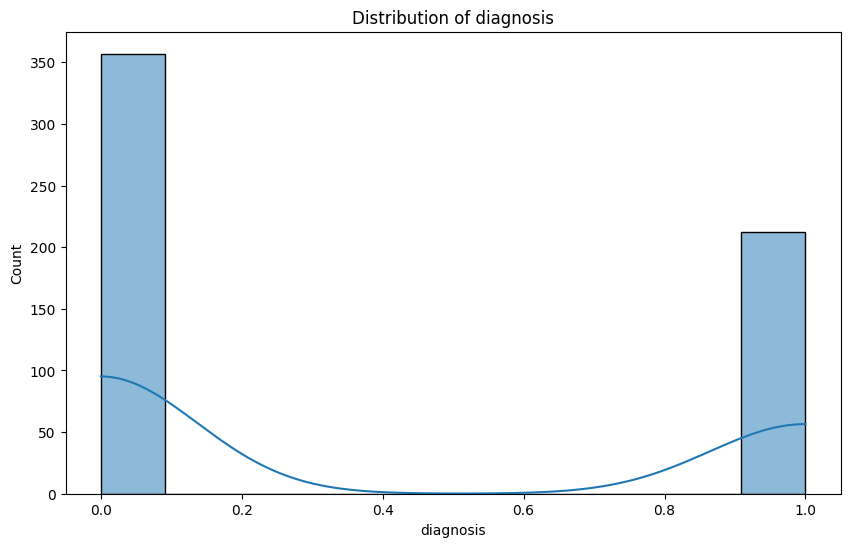

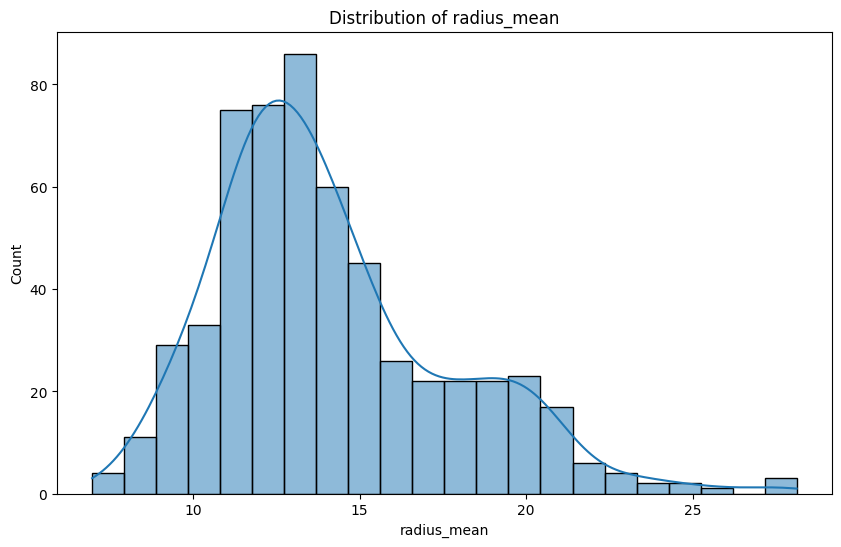

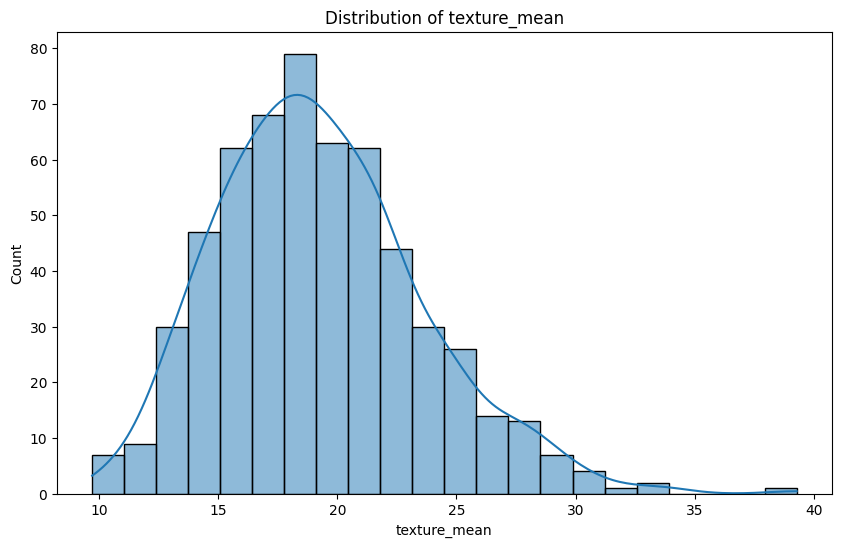

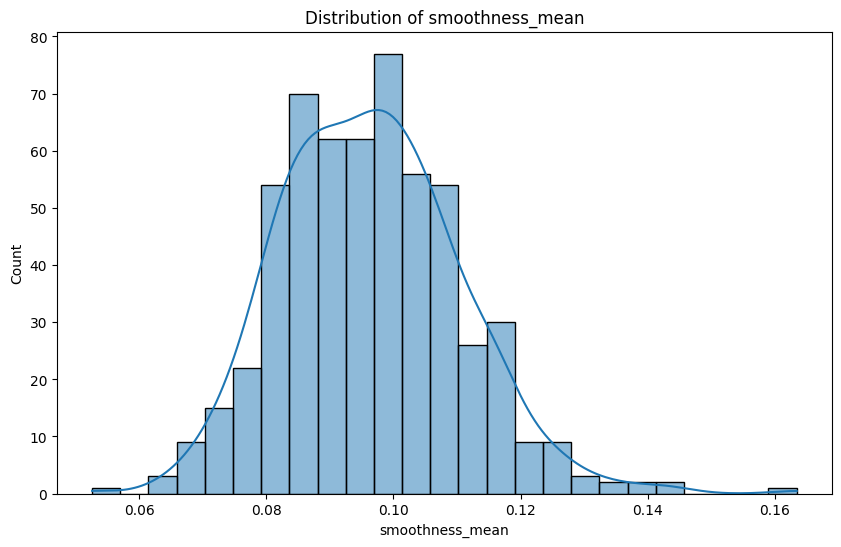

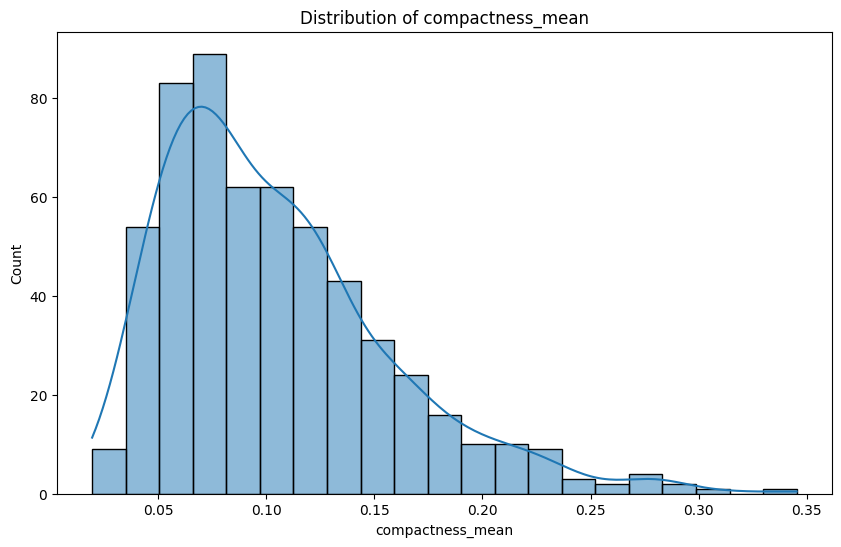

...

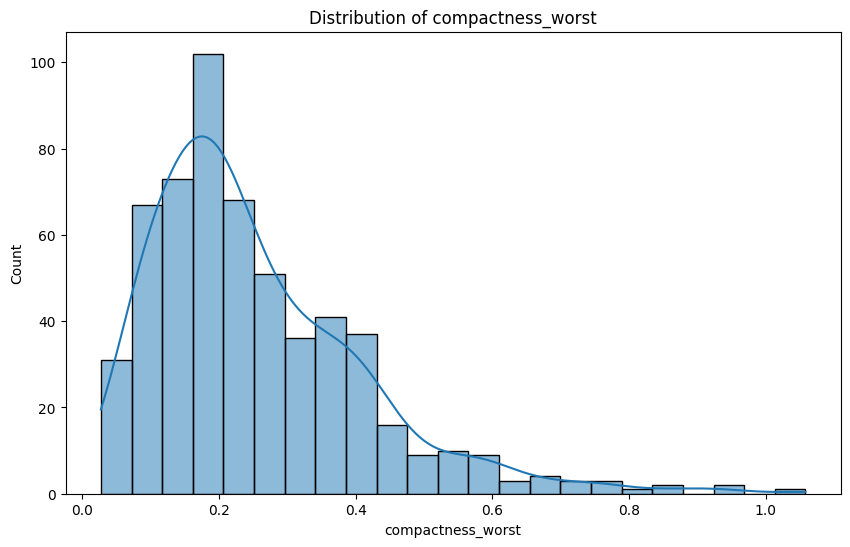

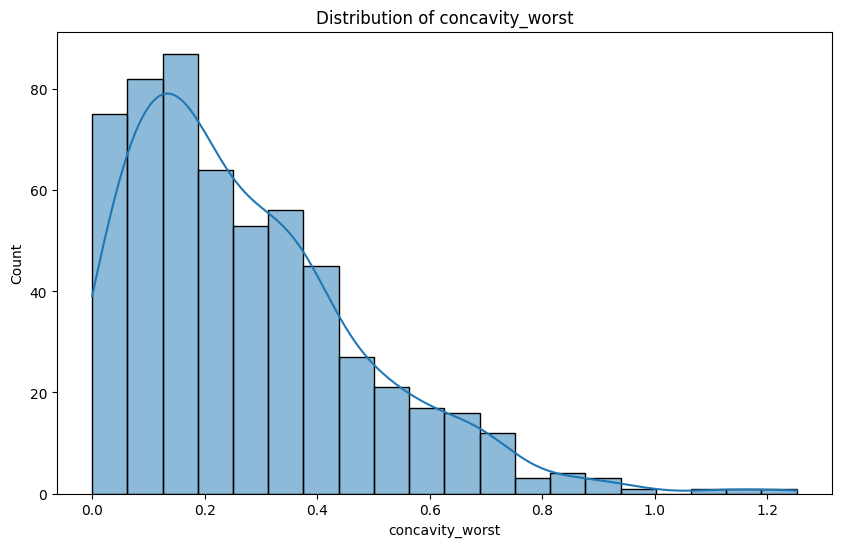

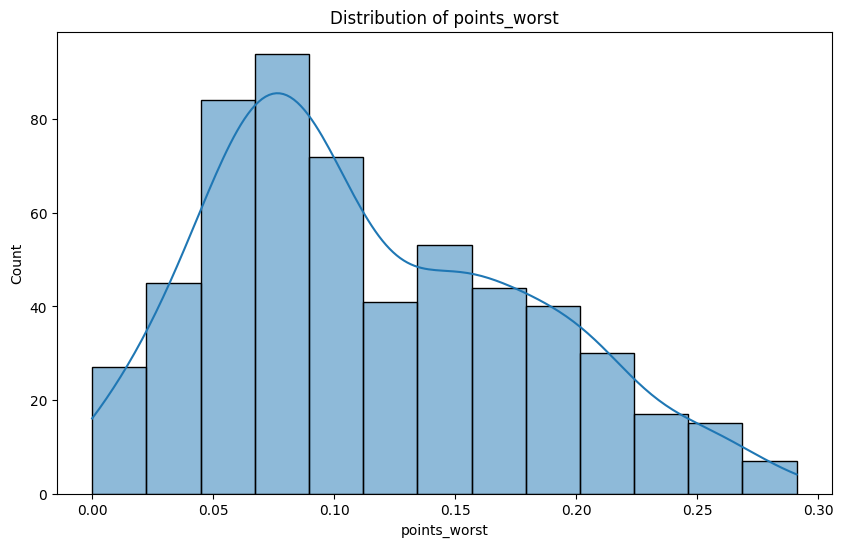

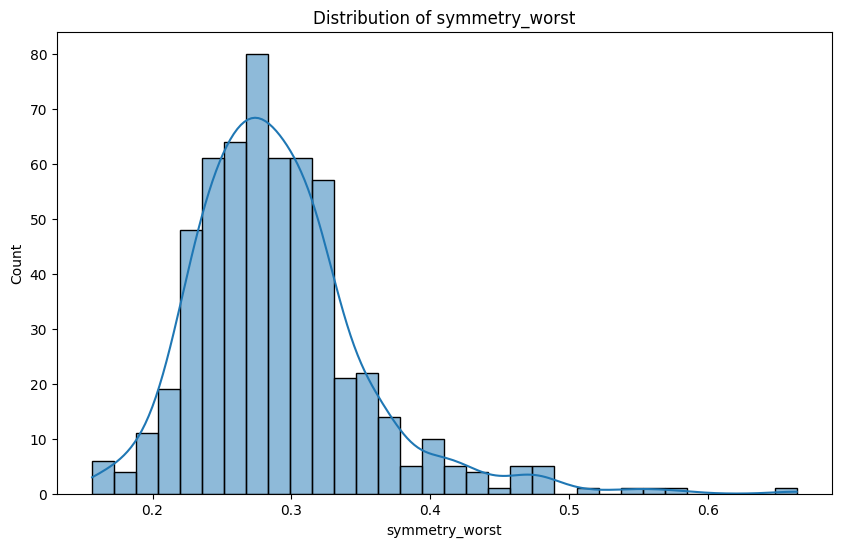

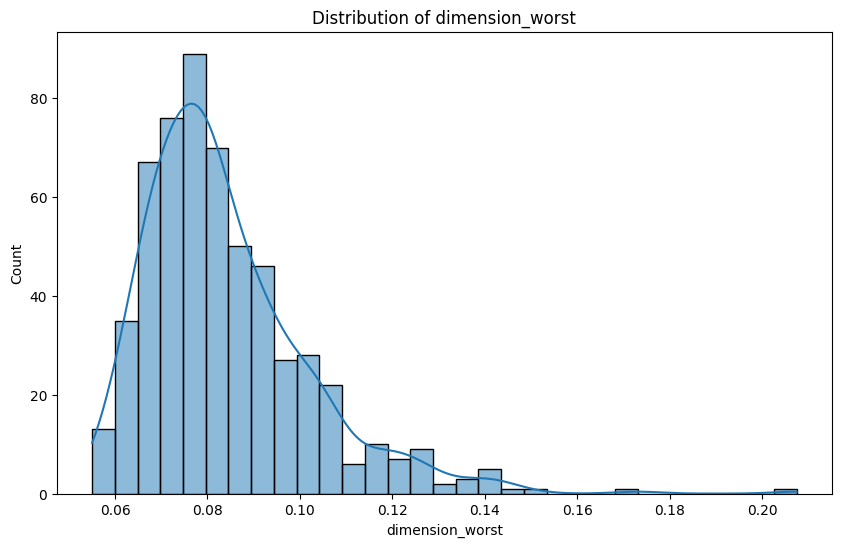

In [12]:
# Histogram Plot with Kernel Density Estimation (KDE)
for column in df.columns:
    if column not in ['target_column', 'id']:
        plt.figure(figsize=(10, 6))
        sns.histplot(df[column], kde=True)
        plt.title(f'Distribution of {column}')
        plt.show()

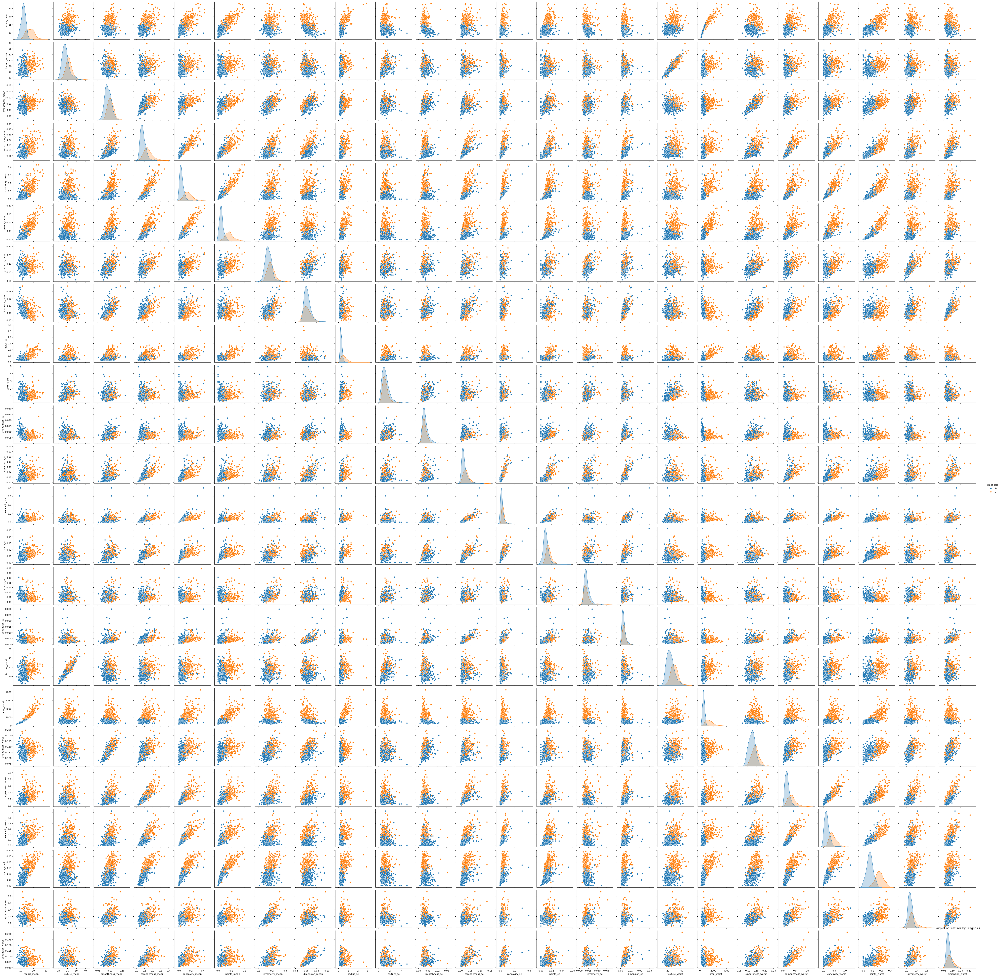

In [94]:
sns.pairplot(df.drop(columns=['id']), hue='diagnosis')
plt.title('Pairplot of Features by Diagnosis')
plt.show()

In [13]:
# Splitting data into Features and target (diagnosis)
X = df.drop(columns=['id', 'diagnosis'])
y = df['diagnosis']

In [14]:
# Split data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [15]:
# Standardize features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Logistic Regression Model

In [16]:
# Initialize and train logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

LogisticRegression()

In [17]:
# predictions
y_pred_log_reg = log_reg.predict(X_val)

In [18]:
# Evaluation
print('Logistic Regression Accuracy:', accuracy_score(y_val, y_pred_log_reg))
print('Logistic Regression Report:', classification_report(y_test, y_pred_log_reg))

Logistic Regression Accuracy: 0.9649122807017544
Logistic Regression Report:               precision    recall  f1-score   support

           0       0.71      0.64      0.68        78
           1       0.36      0.44      0.40        36

    accuracy                           0.58       114
   macro avg       0.54      0.54      0.54       114
weighted avg       0.60      0.58      0.59       114



### Logistic Regression Evaluated on Test Set

In [19]:
def evaluate_model(model, X_test, y_test):
    """
    Evaluate the best model on the test set and perform Chi-Squared test.

    Parameters:
    model: The trained model to be evaluated.
    X_test: The test features.
    y_test: The true labels for the test set.

    Returns:
    None
    """
    # Predict on the test set
    y_test_pred = model.predict(X_test)
    
    # Calculate accuracy
    test_accuracy = accuracy_score(y_test, y_test_pred)
    print(f'Test Accuracy: {test_accuracy}')
    
    # Print classification report
    print(classification_report(y_test, y_test_pred))
    
    # Perform Chi-Squared Test
    contingency_table = pd.crosstab(y_test, y_test_pred)
    chi2, p, dof, ex = chi2_contingency(contingency_table)
    print(f'Chi-Squared: {chi2}, P-Value: {p}, Alpha: 0.05')
    
    # Check statistical significance
    if p < 0.05:
        print('The model performance is statistically significant.')
    else:
        print('The model performance is not statistically significant.')

In [20]:
evaluate_model(log_reg, X_test, y_test)

Test Accuracy: 0.9912280701754386
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        78
           1       0.97      1.00      0.99        36

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

Chi-Squared: 105.04006129006129, P-Value: 1.1969130212953103e-24, Alpha: 0.05
The model performance is statistically significant.


# Random Forest Classifier

In [21]:
# Initialize and train model
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train, y_train)

RandomForestClassifier()

In [22]:
# Predictions
y_pred_rf = rf_clf.predict(X_val)

In [23]:
# Model Evaluation
print('Random Forest Accuracy:', accuracy_score(y_val, y_pred_rf))
print('Random Forest Report:', classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.9473684210526315
Random Forest Report:               precision    recall  f1-score   support

           0       0.72      0.68      0.70        78
           1       0.38      0.42      0.39        36

    accuracy                           0.60       114
   macro avg       0.55      0.55      0.55       114
weighted avg       0.61      0.60      0.60       114



### Random Forest Classifier Evaluated on Test Set

In [24]:
evaluate_model(rf_clf, X_test, y_test)

Test Accuracy: 0.9912280701754386
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        78
           1       0.97      1.00      0.99        36

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

Chi-Squared: 105.04006129006129, P-Value: 1.1969130212953103e-24, Alpha: 0.05
The model performance is statistically significant.


# Support Vector Machine (SVM)

In [25]:
# Initalize and train model
svm_clf = SVC()
svm_clf.fit(X_train, y_train)

SVC()

In [26]:
# Predictions
y_pred_svm = svm_clf.predict(X_val)

In [27]:
# Model Evaluation
print('SVM Accuracy:', accuracy_score(y_val, y_pred_svm))
print('SVM Report:', classification_report(y_test, y_pred_svm))

SVM Accuracy: 0.956140350877193
SVM Report:               precision    recall  f1-score   support

           0       0.72      0.65      0.68        78
           1       0.37      0.44      0.41        36

    accuracy                           0.59       114
   macro avg       0.55      0.55      0.54       114
weighted avg       0.61      0.59      0.60       114



### SVM Evaluated on Test Set

In [28]:
evaluate_model(svm_clf, X_test, y_test)

Test Accuracy: 0.9912280701754386
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        78
           1       0.97      1.00      0.99        36

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114

Chi-Squared: 105.04006129006129, P-Value: 1.1969130212953103e-24, Alpha: 0.05
The model performance is statistically significant.


With an accuracy of 0.9912 and with nearly identical precision and recall, Logistic Regression and SVM are the best options. I chose Logistic Regression because it is a simplier model, it trains faster and it uses less memory.

## Using ML model in terminal
### To train

python ml_pipeline.py

### To predict malignancy of new data with ML model.
python C:\Users\jerem\OneDrive\Capstone\ml_pipeline\ml_pipeline.py --file C:\Users\jerem\OneDrive\Capstone\ml_pipeline\benign_malignant_tumor.csv --batch C:\Users\jerem\OneDrive\Capstone\ml_pipeline\benign_malignant_tumor.csv